# Лекция: Компьютерное зрение. 
## Адаптеры в диффузионных моделях & SOTA модели. Часть 1.
**Преподаватель**: Шевченко Елена, Т-Банк

**Аудитория**: ФКН ВШЭ, МФТИ

### Содержание
1. Адаптеры
    - Зачем нужны, типы адаптеров
    - ControlNet
    - ControlNet family: Controlnext, Controlnet++, SR
    - IP-adapter
    - IP-adapter family
    - Mixed methods

2. Recap: диифузия VS flow matching
3. SOTA models
4. Model distillation

        
    

# I. Адаптеры в диффузионных моделях

## 1. Зачем нужны и какие бывают

### Что вообще можно менять в диффузионной модели?

- **Веса сети** — например, LoRA (разобрали на прошлой лекции): дёшево, но ограниченно
- **Архитектуру сети** — добавить новые входы, новые блоки

### Мотивирующий кейс

Мы хотим передавать сети новый тип **guidance** — управлять генерацией не только с помощью текста.

Примеры такого guidance:
- контуры / края желаемого изображения (Canny edges)
- карта глубины (depth map)
- поза человека (pose keypoints)
- маска сегментации
- стилевой референс (произвольная картинка)

То есть помимо текстового промпта хотим передавать изображение-условие. Как это сделать?

**Вариант 1:** добавить новый вход в архитектуру → конкатенировать с исходным латентом → переобучать всю сеть

```
проблемы:
→ очень дорого (вся сеть с нуля или fine-tune всей сети)
→ рискуем "забыть" качество text2img
→ под каждый тип условия нужна своя модель
```

**Вариант 2:** заморозить основную сеть и обучить небольшую "пристройку", которая инжектирует информацию в основную сеть → **Адаптеры**

```
преимущества:
→ основная сеть не трогается → text2img не деградирует
→ адаптер маленький → обучение дёшево
→ модульность: разные адаптеры для разных задач
   подключаются / отключаются в inference
```

### Разновидности адаптеров

Два принципиально разных типа guidance, для которых нужны разные подходы:

```
Тип 1: Структурный контроль
→ "Где что находится": позы, края, глубина, маски
→ Пространственно-локальная информация
→ Решение: ControlNet и его семейство

Тип 2: Семантический / стилевой контроль
→ "Как выглядит": стиль, внешность, объект-референс
→ Глобальные атрибуты изображения
→ Решение: IP-Adapter и его семейство
```


```
АДАПТЕРЫ ДЛЯ ДИФФУЗИОННЫХ МОДЕЛЕЙ
                              │
              ┌───────────────┴───────────────┐
              │                               │
    СТРУКТУРНЫЙ КОНТРОЛЬ              СЕМАНТИЧЕСКИЙ КОНТРОЛЬ
    (что где находится)               (как выглядит)
              │                               │
         ControlNet                      IP-Adapter
         (2023, CVPR)                    (2023, Tencent)
              │                               │
    ┌─────────┼─────────┐         ┌───────────┼───────────┐
    │         │         │         │           │           │
ControlNet++ ControlNeXt Tile   IP-Adapter+ FaceID   InstantStyle
(consistency)(lightweight)(SR)  (Perceiver) (ArcFace) (style-only,
                                                       inference trick)
              └───────────────┬───────────────┘
                              │
                    СМЕШАННЫЕ МЕТОДЫ
                              │
                    ┌─────────┼─────────┐
                    │         │         │
                InstantID PhotoMaker StyleAligned
               (ID+Pose) (multi-img) (shared-attn)
```
---

## 2. ControlNet 

> Zhang et al., "Adding Conditional Control to Text-to-Image Diffusion Models", CVPR 2023

Хорошо работает со структурным следованием: Canny-гранями, картами глубины, скетчами, картами сегментации, позами людей и т.д. 

### 2.1 Ключевая идея

ControlNet **копирует часть основной сети** (для UNet-based SD — encoder + middle block), замораживает оригинал, и обучает копию принимать изображение-условие. Выходы каждого блока копии **добавляются** к соответствующим блокам основной сети через **zero convolutions**.

```
Оригинальная сеть (frozen):
  Encoder → Middle → Decoder

ControlNet (trainable copy of encoder):
  [условие c] → Conv-in → Enc-блок 1 → Enc-блок 2 → ... → Middle
                              ↓               ↓                ↓
                          zero-conv       zero-conv        zero-conv
                              ↓               ↓                ↓
  Frozen Encoder-1 ──────────+   Frozen Enc-2 ──────────────+  ...
                                                                 ↓
                                                           Frozen Decoder
```

### 2.2 Формальное описание

**Было** (сценарий Text2Img):
$$y_{t2i} = \mathcal{F}(x; \Theta)$$

**Стало** (с ControlNet):
$$y_{c} = \underbrace{\mathcal{F}(x; \Theta)}_{\text{заморожено}} + \mathcal{Z}\!\left(\underbrace{\mathcal{F}\!\left(x + \mathcal{Z}(c;\, \Theta_{z1});\, \Theta_c\right)}_{\text{обучаемая копия}};\, \Theta_{z2}\right)$$

где:
- $\Theta$ — замороженные параметры основной сети
- $\Theta_c$ — параметры обучаемой копии (encoder ControlNet)
- $\Theta_{z1}, \Theta_{z2}$ — параметры zero convolutions (инициализированы нулями)
- $c$ — изображение-условие (Canny-маска, глубина, поза, ...)

### 2.3 Пошаговый разбор на примере SD (UNet)

![controlnet](assets/controlnet.png)

**Шаг 1.** Замораживаем основную сеть (encoder + middle + decoder).

**Шаг 2.** Создаём обучаемую копию encoder'а и middle block'а с теми же весами (инициализируем из основной сети).

**Шаг 3.** Создаём маленький **conditioning encoder** — набор из 4 свёрточных слоёв (stride=2, channel-doubling) для перевода изображения-условия из пространства пикселей в пространство латентов. 

**Шаг 4.** На каждом шаге деноизинга:
- Основная сеть принимает зашумленный латент $x_t$ и текст $c_t$
- ControlNet принимает $x_t$ + **обработанное условие** $\mathcal{Z}(c; \Theta_{z1})$
- Выходы каждого блока ControlNet прибавляются к соответствующим **входам блоков decoder'а** основной сети

**Шаг 5.** Обучаем на стандартном диффузионном лоссе с новым условием.

### 2.4 Zero Convolutions — зачем и как

**Проблема:** в начале обучения ControlNet ещё не обучен и выдаёт случайные (шумовые) активации. Если сразу прибавлять их к основной сети — мы **подаем несанкционированный шум** в frozen сеть, которая уже умеет генерировать. Качество text2img в начале обучения полностью деградирует.

**Решение:** пропускаем выходы через **1×1 свёртки, инициализированные нулями** (нулевые веса и нулевые biases):

$$\mathcal{Z}(\cdot\,; \Theta_z) = W_z \cdot (\cdot) + b_z, \quad W_z = 0,\; b_z = 0$$

```
В начале обучения:
  Z(features) = 0 × features + 0 = 0
  → ControlNet вносит нулевой вклад
  → основная сеть работает как обычный text2img
  → качество не деградирует

По мере обучения:
  веса Wz начинают обновляться градиентами
  → Z(features) ≠ 0
  → ControlNet начинает вносить вклад пропорционально
    тому, насколько адаптировался к задаче
```
**Феномен внезапной сходимости**: из-за того, что на первых шагах обучения градиент по $W_z$ отличен от нуля только "с одной стороны" (после того как активации encoder'а начали меняться), обучение имеет характерную кривую сходимости с резким скачком. Это нормально и ожидаемо.

![phenomen](assets/conv_phenomen.png)

### 2.5 Функция потерь

Стандартный диффузионный loss с новым структурным условием $c_f$:

$$\mathcal{L} = \mathbb{E}_{z_0, t, c_t, c_f, \epsilon \sim \mathcal{N}(0,1)}\!\left[\left\|\epsilon - \epsilon_{\theta}(z_t, t, c_t, c_f)\right\|_2^2\right]$$

где $c_t$ — текстовый промпт, $c_f$ — структурное условие (Canny, depth и т.д.).

Обучение устойчиво даже на маленьких датасетах (<50k пар) и сопоставимо по скорости с файнтюнингом всей модели .

### 2.6 ControlNet и CFG
**CFG:** $ \epsilon = \epsilon_{uc} + \beta_{cfg}(\epsilon_{c} - \epsilon_{uc}) $
 
**Проблема:** при использовании Classifier-Free Guidance на каждом шаге делается **два forward pass**: условный (с промптом) и безусловный (с пустым промптом).

Вопрос: к каким из двух pass'ов применять ControlNet?

| Вариант | Поведение |
|---|---|
| Только к **conditional** | Очень жёсткое следование условию при высоком CFG scale |
| К **обоим** | При генерации без промпта условие "теряется" (ControlNet влияет и на безусловный pass) |


![cfg1](assets/cfg.png)

**Решение авторов:** применять ControlNet **только к conditional pass**, но при этом **перевзвешивать влияние по блокам** в зависимости от пространственного разрешения:

$$w_i = \frac{64}{h_i}, \quad h_i \in \{8, 16, 32, 64\}$$

где $h_i$ — пространственный размер feature map блока $i$.

```
Блоки с низким разрешением (семантика, h=8):
  w = 64/8 = 8  → большой вес, сильное влияние
  
Блоки с высоким разрешением (детали, h=64):
  w = 64/64 = 1 → малый вес, слабое влияние
```

Смысл: при больших CFG scale структурные условия из семантических блоков важнее, а детали генерации не должны быть жёстко привязаны к условию.

![cfg_g1](assets/cfg_good.png)

### 2.7 Поддерживаемые типы условий

ControlNet 1.1 включает отдельно обученные модели для каждого типа:

```
Структурные:
  Canny          → карта границ (Canny edge detection)
  HED / Scribble → мягкие границы, скетчи
  MLSD           → прямые линии (для архитектуры)
  Depth          → карта глубины (MiDaS / LeReS)
  Normal         → карта нормалей поверхности

Семантические:
  Segmentation   → карта сегментации (ADE20k / COCO)
  
Human-centric:
  OpenPose       → ключевые точки тела / рук / лица
  DWPose         → улучшенный pose estimator

Прочие:
  Inpaint        → маска для заполнения
  Shuffle / IP2P → reference-based управление
  Tile           → upscaling с детализацией
```

---

In [2]:
import torch
import numpy as np
from PIL import Image
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
from diffusers.utils import load_image
import cv2
from matplotlib import pyplot as plt
%matplotlib inline

# Загружаем ControlNet + pipeline
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/sd-controlnet-canny",
    torch_dtype=torch.float16
)
pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=controlnet,
    torch_dtype=torch.float16
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


  0%|          | 0/30 [00:00<?, ?it/s]

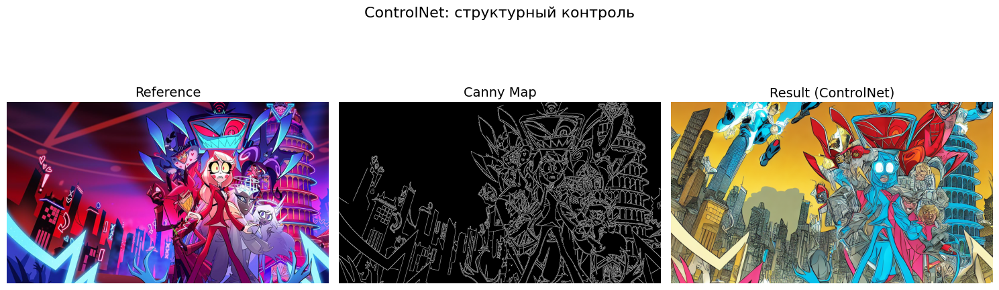

In [6]:
# Загружаем референс
reference = load_image("assets/hazbin.jpg")
reference_np = np.array(reference)

# Извлекаем структуру — Canny edges
def extract_canny(image_np: np.ndarray, low: int = 100, high: int = 200) -> Image.Image:
    gray = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)
    edges = cv2.Canny(gray, low, high)
    # ControlNet ожидает RGB
    edges_rgb = np.stack([edges] * 3, axis=-1)
    return Image.fromarray(edges_rgb)

canny_map = extract_canny(reference_np)

# Генерируем — структура берется с картинки, стиль можем задать сами
result_structural = pipe(
    prompt="city of future, superheros, colorful, comic style",
    negative_prompt="blurry, low quality",
    image=canny_map,
    num_inference_steps=30,
    controlnet_conditioning_scale=1.0,  # сила следования структуре
    guidance_scale=7.5,
).images[0]

# --- Визуализация ---
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(reference)
axes[0].set_title("Reference", fontsize=14)
axes[0].axis("off")

axes[1].imshow(canny_map)
axes[1].set_title("Canny Map", fontsize=14)
axes[1].axis("off")

axes[2].imshow(result_structural)
axes[2].set_title("Result (ControlNet)", fontsize=14)
axes[2].axis("off")

plt.suptitle("ControlNet: структурный контроль", fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig("step1_structural_grid.png", bbox_inches="tight")
plt.show()

## 3. Семейство ControlNet

### 3.1 ControlNet++ (ECCV 2024) 

> Li et al., "ControlNet++: Improving Conditional Controls with Efficient Consistency Feedback", ECCV 2024

![controlnet_plus](assets/controlnet_plus.png)

**Проблема оригинального ControlNet:** модель обучается минимизировать диффузионный loss на датасете пар (изображение, условие). Но нигде в лоссе никак явно не учитывается, чтобы **сгенерированное изображение** жестко следовало структурному условию.

Простой пример:

```
ControlNet с Canny:
  вход:  canny_map(исходное изображение)
  выход: сгенерированное изображение
  
Проверка: canny_map(сгенерированное изображение) ≈ ?
  → Не обязательно совпадает с исходным canny_map!
  → Структура может быть "правильной на взгляд",
    но не pixel-perfect точной
```

**Решение ControlNet++:** добавить **cycle consistency loss** — явно штрафовать за несоответствие между входным условием и условием, извлечённым из сгенерированного изображения.

![controlnet_plus_2](assets/controlnet_plus2.png)

**Проблема наивной реализации:** для вычисления consistency loss нужно:
1. Сгенерировать полное изображение (50 шагов)
2. Применить preprocessor
3. Считать loss

→ Это в 50 раз дороже обычного шага обучения. Неприемлемо.

**Эффективное решение:** вместо полной генерации использовать **одношаговый деноизинг** зашумленного реального изображения:

```
алгоритм:
1. берём реальное изображение x_0 с известным условием c
2. добавляем шум: x_t = noising(x_0, t)
3. делаем один шаг деноизинга: x̂_0 = denoise(x_t, t, c)
   (это дёшево — один forward pass)
4. применяем reward model (discriminative): r = R(x̂_0)
   → R — предобученная модель (pose estimator, edge detector...)
5. consistency loss: L_cons = ||R(x̂_0) - c||²

итоговый loss:
L = L_diffusion + λ · L_consistency
``` 

---

### 3.2 ControlNeXt (2024)

> Peng et al., "ControlNeXt: Powerful and Efficient Control for Image and Video Generation", arXiv:2408.06070

![controlnext](assets/controlnext.png)

#### Проблема ControlNet

ControlNet копирует **весь encoder основной сети** — это дорого:

```
SD 1.5 ControlNet:  ~360M доп. параметров
SDXL ControlNet:    ~1.2B доп. параметров
видео-модели:       inference и без того дорогой
                    удвоение параметров неприемлемо
```

Кроме того, zero-conv создаёт **проблему совместимости распределений**:

```
Предобученная frozen сеть:
→ устоявшееся распределение активаций (μ_m, σ²_m)

Новая обучаемая ветвь (случайная инициализация):
→ хаотичное распределение активаций

При сложении:
  denoising_features (стабильное распределение)
      +
  control_features   (хаотичное распределение)
      =
  испорченные features → деградация качества
```

ControlNet решает это через zero-conv: обнуляет выход новой ветви на старте и постепенно "открывает кран". Но это приводит к **медленной сходимости** и феномену внезапного скачка качества.

Также ControlNet **плохая совместимость с LoRa**: надо заново их обучать

---

#### Архитектура ControlNeXt

**Две ключевые идеи:**

**1.** Вместо копии encoder'а — **маленькая независимая сеть** $F_c$:

```
ControlNet:   копия encoder (360M-1.2B params)
ControlNeXt:  лёгкая conv сеть (несколько MB)
```

**2.** Вместо zero-conv — **Cross Normalization** для согласования распределений.

Формула ControlNet:

$$y_c = \mathcal{F}(x;\Theta) + \mathcal{Z}\!\left(\mathcal{F}(x + \mathcal{Z}(c;\Theta_{z1});\Theta_c);\Theta_{z2}\right)$$


Формула ControlNeXt:

$$y_c = \mathcal{F}_m(x, \mathcal{F}_c(c;\, \theta_c);\, \theta'_m)$$

где:
- $\mathcal{F}_c(c; \theta_c)$ — лёгкая контрольная ветвь, принимает условие $c$, параметры $\theta_c$
- $\mathcal{F}_m(x, \ldots; \theta'_m)$ — основная сеть, принимает зашумлённый латент $x$ и control features
- $\theta'_m$ — параметры основной сети с частичным fine-tuning небольшого подмножества параметров (авторы называют это "selective fine-tuning")


```
ControlNet:
→ основная сеть полностью заморожена
→ control features ПРИБАВЛЯЮТСЯ снаружи через zero-conv

ControlNeXt:
→ control features передаются ВНУТРЬ основной сети
→ основная сеть частично обучается через LoRA (θ'_m)
→ Cross Normalization согласует распределения внутри F_m
```

---

#### Cross Normalization

**Идея:** вместо того чтобы обнулять выход новой ветви, **привести его распределение к распределению основной сети** — тогда сложение корректно с первого шага обучения .

Статистики ($\mu_m$, $\sigma^2_m$) берём из denoising features основной сети, нормализуем ими control features:

$$\hat{x}_c = \gamma \cdot \frac{x_c - \mu_m}{\sqrt{\sigma^2_m + \varepsilon}}$$

где:
- $x_c$ — control feature из $F_c$ (то что нормализуем)
- $\mu_m,\, \sigma^2_m$ — среднее и дисперсия **denoising feature** основной сети
- $\gamma$ — обучаемый скалярный параметр масштабирования
- $\varepsilon$ — малая константа для численной стабильности

```
Батч-нормализация (для сравнения):
  нормализуем x_c статистиками самого x_c
  μ = mean(x_c), σ² = var(x_c)

Cross Normalization:
  нормализуем x_c статистиками ДРУГОГО тензора
  μ_m = mean(denoising_feat)
  σ²_m = var(denoising_feat)
  → control features приводятся к распределению
    denoising features основной сети
```

**Почему лучше zero-conv:**

```
zero-conv:
  начало обучения: выход = 0
  → контроль не работает совсем
  → нужно много шагов чтобы веса "открылись"
  → медленная сходимость, феномен внезапного скачка

Cross Normalization:
  начало обучения: control features уже совместимы
  по распределению с denoising features
  → можно использовать контрольную информацию сразу
  → значительно быстрее сходимость
```

---

#### Что обучается

```
F_c (контрольная ветвь):
→ маленькая conv сеть
→ обучается с нуля
→ принимает условие c (Canny, depth, поза...)

selective fine-tuning основной сети:
→ небольшое подмножество параметров θ'_m
→ адаптирует основную сеть под использование
  control features от F_c

Cross Normalization γ:
→ обучаемый скалярный параметр
→ масштабирует нормализованные control features
```

---

#### Применение: видео-генерация

ControlNeXt особенно актуален для **видео-моделей**, где inference и без того очень дорогой:

```
видео-модели (CogVideoX, SVD):
  → огромный inference cost (много фреймов × много шагов)
  → добавить полноразмерный ControlNet-копию → неприемлемо
  → ControlNeXt: несколько MB контрольной сети
    вместо копии всего encoder'а
```

### 3.3 Super-Resolution как кейс применения адаптеров

![controlnet-tile](assets/controlnet-tile.png)

#### Задача

Super-Resolution — **восстановление высокого разрешения из низкого** — естественный кейс для адаптеров: сохранить структуру исходного изображения и добавить детали, не переобучая всю модель.

```
наивный подход:
  bicubic upscale → мыльная картинка, нет новых деталей
  img2img SD      → меняет структуру вместе со стилем

адаптер-подход:
  структура сохранена через ControlNet-условие
  детали добавляются диффузией
```

---

#### Таксономия SR методов

```
Детерминированные апскейлеры (быстро, без галлюцинаций):
  bicubic / lanczos  — классика, нет деталей
  Real-ESRGAN        — GAN-based, синтетические деградации
  SPAN               — CNN+Attention гибрид,
                       1 место NTIRE 2024 Efficient SR

Диффузионные SR специализированные:
  SR3                — обучена с нуля под SR (Google, 2021)
  ResShift           — SR через residual shifting
  DiffBIR            — двухэтапный: реконструкция → SD refinement

Диффузионные SR адаптер-подход:
  StableSR           → SD 1.5 + feature injection
  SeeSR              → SD2 + DAPE (degradation-aware prompts)
  SUPIR              → SDXL + LQ encoder + LLaVA
  Jasper Upscaler    → Flux.1-dev + ControlNet
  ControlNet Tile    → SD/SDXL + тайлинг
```

---

#### ControlNet Tile: как работает для SR

**Ключевая идея:** передавать в ControlNet **намеренно размытую версию тайла** как условие — структура сохранена, детали не заданы жёстко, модель галлюцинирует их сама.

**Preprocessor tile_resample:**

```
тайл оригинального изображения (512×512)
        ↓
downscale (512→128) → upscale (128→512)
        ↓
размытая версия тайла (структура есть, деталей нет)
        ↓
это и есть ControlNet-условие c
```

Зачем размывать:

```
чёткий тайл как условие:
  → модель жёстко копирует исходник
  → новые детали не добавляются

размытый тайл как условие:
  → структура (формы, цвета, layout) задана
  → конкретные детали не заданы
  → модель галлюцинирует детали в рамках структуры
```

**Почему модель игнорирует промпт:**

При обучении ControlNet Tile текстовый промпт намеренно делался случайным или пустым — модель училась опираться на визуальное условие $c$ больше чем на текст. Поэтому в inference:

```
локальные детали тайла ≠ промпту
→ модель игнорирует промпт
→ заполняет детали из локального контекста тайла
```

**Зачем тайлинг:**

```
большое изображение (2048×2048):
  → огромный латент → не помещается в VRAM
  → quadratic complexity в attention

тайлинг 512×512 с overlap:
  → каждый тайл обрабатывается независимо
  → в зоне перекрытия — взвешенное blending
    (MultiDiffusion)
  → работает даже на 4GB VRAM
```

**Пайплайн:**

```
low-res изображение
        ↓
SPAN / Real-ESRGAN   ← быстрый pixel upscale
        ↓
апскейленное изображение (мыльное)
        ↓
разбивка на тайлы 512×512 с overlap
        ↓
для каждого тайла:
  tile_resample preprocessor (размытие)
        ↓
  img2img + ControlNet Tile
  denoising_strength = 0.3–0.45
        ↓
  детализированный тайл
        ↓
MultiDiffusion blending
        ↓
итоговое изображение с новыми деталями
```

**Версии:**

```
SD 1.5: control_v11f1e_sd15_tile
SDXL:   controlnet-tile-sdxl-1.0 (xinsir)
```

---

#### Другие диффузионные SR адаптеры

**SeeSR (CVPR 2024)** — SD2 + DAPE адаптер:

```
DAPE (Degradation-Aware Prompt Extractor):
  деградированное изображение
      ↓
  → hard prompts (image tags)
  → soft prompts (семантика)
  → LR интегрируется в начальный шум
предобученный SD2 (frozen) + обучаемый DAPE
```

**SUPIR (2024)** — SDXL + LQ encoder + LLaVA:

```
LQ Encoder:
  деградированное изображение
      ↓
  feature injection в SDXL через cross-attention

LLaVA:
  автоматически генерирует текстовый промпт
  по деградированному изображению

два режима:
  SUPIR-v0F: точное следование структуре
  SUPIR-v0Q: максимальное качество, больше галлюцинаций
```

**Jasper Upscaler** — Flux.1-dev + ControlNet:

```
обучен на synthetic degradations:
  Gaussian noise, Poisson noise, blur, JPEG

преимущество над ControlNet Tile:
  → Flux.1-dev как более мощный prior
  → нет тайлинга — обрабатывает целиком
    (RoPE позволяет обобщаться на новые разрешения)
```

---

#### Сравнение подходов

| | Скорость | VRAM | Галлюцинации | Детали |
|---|---|---|---|---|
| SPAN | очень быстро | мало | нет | среднее |
| Real-ESRGAN | быстро | мало | нет | среднее |
| ControlNet Tile | медленно | мало (тайлинг) | умеренно | высокое |
| SeeSR | медленно | средне | умеренно | высокое |
| SUPIR | очень медленно | много | много | очень высокое |
| Jasper | медленно | много | умеренно | высокое |

---

#### Лучшая практика: комбинированный пайплайн

```
SPAN / Real-ESRGAN
(быстрый pixel upscale, структура сохранена)
        ↓
ControlNet Tile / Jasper Upscaler
(диффузионная детализация)
        ↓
результат: скорость детерминированного апскейла
           + качество диффузионного SR
```

## 4. IP-Adapter 

> Ye et al., "IP-Adapter: Text Compatible Image Prompt Adapter for Text-to-Image Diffusion Models", Tencent AI Lab, 2023

![ip_adapter](assets/ip_adapter_general.png)

### 4.1 Мотивация

**"An image is worth a thousand words"** — но как передать "изображение-референс" в диффузионную модель, не теряя совместимости с текстом?

```
прямые методы:
  image-to-image: через шум
    → меняет структуру вместе со стилем
    → нет точного управления "насколько" следовать референсу
    
  fine-tuning (DreamBooth / Textual Inversion):
    → дорого, по 20-1000 изображений на сущность
    → отдельная модель под каждый объект
    → не совместимо с другими LoRA/ControlNet
```

**Цель IP-Adapter:** легковесный адаптер (~22M параметров), который:
- Принимает **одно** изображение-референс
- Работает **параллельно** с текстом (не вместо него)
- Совместим с любыми файнтюненными версиями базовой модели
- Совместим с ControlNet (структурный + семантический контроль одновременно) 

---

### 4.2 Архитектура: Decoupled Cross-Attention

![dec_attn](assets/decoupled-attention.png)

**Ключевая идея:** изображение-референс и текст — разные типы условий и должны обрабатываться **раздельными cross-attention слоями**.

**Стандартный cross-attention в UNet/DiT:**

```
Q = Linear_Q(x)          ← из feature map сети
K = Linear_K(text_emb)   ← из текстового эмбеддинга
V = Linear_V(text_emb)   ← из текстового эмбеддинга

Attention = softmax(QKᵀ/√d) · V
```

**IP-Adapter добавляет параллельный image cross-attention:**

```
# Текстовый cross-attention (FROZEN):
Q   = Linear_Q(x)
K_t = Linear_K(text_emb)
V_t = Linear_V(text_emb)
out_text = softmax(Q · K_tᵀ / √d) · V_t

# Image cross-attention (TRAINABLE):
K_i = Linear_K'(image_emb)   ← НОВЫЕ параметры
V_i = Linear_V'(image_emb)   ← НОВЫЕ параметры
out_image = softmax(Q · K_iᵀ / √d) · V_i

# Суммирование:
out = out_text + λ · out_image
                ↑
           ip_adapter_scale,
           контролирует силу image guidance
```

**Что заморожено, что обучается:**

```
FROZEN:
  - вся основная сеть (UNet/DiT)
  - текстовый энкодер (CLIP text)
  - image encoder (CLIP ViT)

TRAINABLE (~22M params):
  - image projection (Linear: clip_dim → attn_dim)
  - K' и V' проекции нового cross-attention
    (по одной паре KV на каждый attention блок)
```

---

### 4.3 Image Encoder: CLIP ViT

Для получения image эмбеддинга используется **предобученный CLIP image encoder** (ViT-H/14 или ViT-L/14):

```
референс-изображение
       ↓
CLIP ViT (frozen)
       ↓
патч-эмбеддинги: [CLS, p1, p2, ..., p256]
       ↓
Image Projection Network (trainable)
       ↓
image_tokens (N_q × d_attn)
       ↓
K', V' проекции в каждый cross-attention блок
```

**Два варианта проецирования:**

| Вариант | Архитектура | Особенности |
|---|---|---|
| IP-Adapter | Linear projection | Быстро, глобальный семантический эмбеддинг |
| IP-Adapter Plus | Query Resampler (Perceiver) | Точнее следует деталям референса |

**IP-Adapter Plus** использует **learned query tokens** (как в Flamingo/BLIP-2):

```
learnable queries (N_q × d)
    ↓
cross-attention с патч-эмбеддингами CLIP
    ↓
N_q image tokens (более детализированные чем один CLS токен)
```

---

### 4.4 Процесс обучения

**Данные:** ~10M пар изображение-текст (LAION и аналоги).

**Self-supervised:** одно и то же изображение используется как **условие** и как **таргет**:

```
шаг 1: берём изображение x_0 и текст c_t из датасета

шаг 2: получаем image embedding:
  image_emb = CLIP_image_encoder(x_0)
                                  ↑
               то же x_0 что и таргет

шаг 3: добавляем шум:
  x_t = (1-t) · x_0 + t · z,  z ~ N(0,1)

шаг 4: forward pass:
  ε_pred = UNet(x_t, t, c_t, image_emb)

шаг 5: стандартный диффузионный лосс:
  L = ||ε_pred - ε||²

шаг 6: backward:
  обновляем только KV' проекции и image projection
  UNet и CLIP заморожены
```

Никакой отдельной разметки не нужно — берём любой датасет image-text пар.

**CFG dropout при обучении** — чтобы модель умела балансировать между текстом и изображением:

```
с вероятностью p_1: заменяем текст на ""
  → модель учится работать без текста

с вероятностью p_2: заменяем image_emb на нули
  → модель учится работать без image prompt

в inference:
  ip_adapter_scale = 1.0  → image доминирует
  ip_adapter_scale = 0.5  → баланс
  ip_adapter_scale = 0.2  → текст доминирует
```

---

### 4.5 Применение: стилевая генерация

IP-Adapter естественным образом решает задачу **style transfer** и **style-guided generation**:

```
Кейс 1: Style reference
  вход:   картина в стиле импрессионизма + промпт "cat"
  выход:  кот нарисованный в стиле импрессионизма

Кейс 2: Subject reference
  вход:   фото конкретной сумки + промпт "photo on beach"
  выход:  та же сумка на пляже

Кейс 3: Text + Image multimodal
  вход:   референс интерьера + промпт "modern minimalist"
  выход:  интерьер в похожем стиле с современным минимализмом
```

**Комбинация с ControlNet:**

```
ControlNet (структура):  "где расположены объекты"
IP-Adapter  (стиль):     "как это выглядит визуально"

пример: поза из ControlNet-Pose + стиль аниме из IP-Adapter
```

---

In [13]:
from ip_adapter import IPAdapter
from diffusers import StableDiffusionPipeline
from huggingface_hub import hf_hub_download


# Базовый pipeline (без ControlNet)
pipe = StableDiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    torch_dtype=torch.float16
).to("cuda")


# скачивает в кэш и возвращает путь к файлу
ip_ckpt = hf_hub_download(
    repo_id="h94/IP-Adapter",
    filename="models/ip-adapter_sd15.bin",
)

# Подключаем IP-Adapter
ip_adapter = IPAdapter(
    pipe,
    image_encoder_path="laion/CLIP-ViT-H-14-laion2B-s32B-b79K",
    ip_ckpt=ip_ckpt,
    device="cuda"
)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

models/ip-adapter_sd15.bin:   0%|          | 0.00/44.6M [00:00<?, ?B/s]

  0%|          | 0/30 [00:00<?, ?it/s]

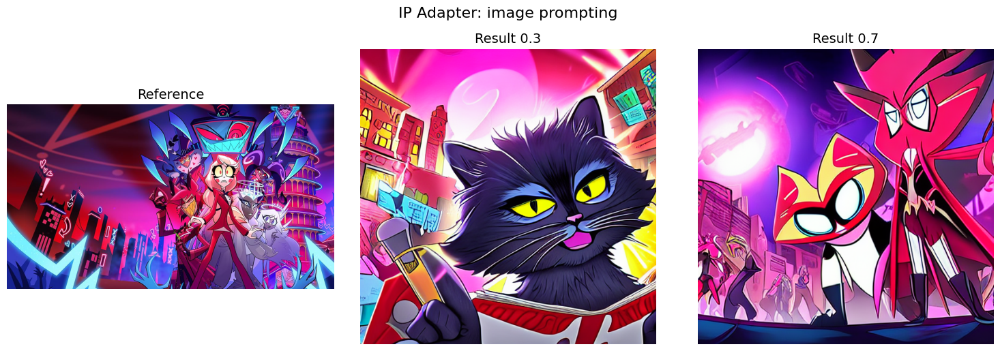

In [29]:
# Стилевой референс — картина
style_reference = Image.open("assets/hazbin.jpg")

# Генерируем с переносом стиля
result_style03 = ip_adapter.generate(
    pil_image=style_reference,
    prompt="fluffy cat",
    negative_prompt="blurry, low quality",
    num_samples=1,
    num_inference_steps=30,
    scale=0.3,   # сила влияния image prompt
)[0]

result_style07 = ip_adapter.generate(
    pil_image=style_reference,
    prompt="fluffy cat",
    negative_prompt="blurry, low quality",
    num_samples=1,
    num_inference_steps=30,
    scale=0.7
)[0]

# --- Визуализация ---
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(style_reference)
axes[0].set_title("Reference", fontsize=14)
axes[0].axis("off")

axes[1].imshow(result_style03)
axes[1].set_title("Result 0.3", fontsize=14)
axes[1].axis("off")

axes[2].imshow(result_style07)
axes[2].set_title("Result 0.7", fontsize=14)
axes[2].axis("off")

plt.suptitle("IP Adapter: image prompting", fontsize=16, y=1.02)
plt.tight_layout()
plt.savefig("step1_structural_grid.png", bbox_inches="tight")
plt.show()

## 5. Семейство IP-Adapter

### 5.1 InstantStyle (2024)

![inst_style](assets/inst_style.png)

> Wang et al., "InstantStyle: Free Lunch towards Style-Preserving in Text-to-Image Generation", arXiv:2404.02733

**Проблема базового IP-Adapter:** CLIP image embedding смешивает стиль и контент в одном векторе:

```
референс: картина Ван Гога с подсолнухами
промпт:   "a cat"

базовый IP-Adapter:
  → переносит стиль Ван Гога ✓
  → но также тянет подсолнухи из референса ✗
     (контент референса "просачивается")
```

**Два ключевых наблюдения:**

**1.** Разные слои UNet отвечают за разные аспекты:

```
spatial attn слои (down_blocks, up_blocks):
  → layout, структура, контент
  → "где что находится"

style attn слои (конкретные блоки):
  → текстуры, цвета, стиль
  → "как это выглядит"
```

**2.** Вычитание контентного embedding даёт "чистый" стиль (опционально):

```
style_emb = image_emb - content_emb
              ↑              ↑
        CLIP image      CLIP text embedding
        embedding       контента референса
```

**Два изменения относительно базового IP-Adapter:**

**Изменение 1:** инжекция только в style-специфичные слои:

```
базовый IP-Adapter:
  KV' во ВСЕ cross-attention слои
  → стиль + контент + layout

InstantStyle:
  KV' только в два блока:
  → up_blocks[0].attentions
  → up_blocks[1].attentions
     ↑
  максимально отвечают за стиль
```

**Изменение 2:** вычитание контента из embedding:

```
image_emb   = CLIP_image(референс)
content_emb = CLIP_text("описание контента референса")
style_emb   = image_emb - content_emb
```

**Важно — это inference-time trick, ничего не обучается** :

```
используются уже обученные веса IP-Adapter
меняется только:
  1. в какие слои инжектировать
  2. какой embedding подавать
→ "free lunch" из названия статьи
```

**Результат:**

```
InstantStyle:
  референс: картина Ван Гога с подсолнухами
  промпт:   "a cat"
  → кот в стиле Ван Гога ✓
  → подсолнухи не просачиваются ✓
  → мазки, цвета, текстура сохранены ✓
```

---

#### Использование идеи об отдельных блоках

**Хотим больше перенести стиль:**

![style](assets/img_prompt.png)



**Хотим передать контекст:**

![obj](assets/img_prompt_i2i_field.png)


### 5.2 IP-Adapter-Plus

Улучшенная версия с Perceiver Resampler вместо линейной проекции:

```
→ точнее воспроизводит детали референса
→ лучше работает на текстурах и мелких деталях
→ learned queries "выбирают" нужную информацию
  из патч-эмбеддингов через cross-attention
```

---

### 5.3 IP-Adapter-FaceID

**Задача:** сохранение идентичности конкретного лица.

**Проблема базового IP-Adapter:** CLIP ViT кодирует изображение как "сцена в целом" — лицо теряется среди фона, одежды, позы.

**Решение:** заменить CLIP на **face recognition model** (InsightFace / ArcFace):

```
базовый IP-Adapter:
  CLIP ViT → общий image emb → K', V'

IP-Adapter-FaceID:
  InsightFace → face ID emb (512-dim) → Linear → K', V'

face ID emb инвариантен к:
  - освещению
  - повороту головы
  - выражению лица
  - фону
```

**IP-Adapter-FaceID Plus v2:** комбинирует два типа эмбеддингов:

```
FaceID emb (identity) ──┐
                         ├──→ joint projection → KV cross-attention
CLIP face emb (struct)──┘
+ LoRA веса (ID fidelity)
```

---

### 5.4 Обзор линейки

| Модель | Image Encoder | Что контролирует |
|---|---|---|
| IP-Adapter | CLIP ViT-L (CLS) | Общий стиль и содержание |
| IP-Adapter Plus | CLIP ViT-H (patches + resampler) | Детали стиля, текстуры |
| IP-Adapter Plus Face | CLIP ViT-H (face crop) | Внешность лица |
| IP-Adapter FaceID | InsightFace ArcFace | Идентичность лица |
| IP-Adapter FaceID Plus v2 | ArcFace + CLIP face | ID + структура + LoRA |
| InstantStyle | IP-Adapter веса (inference trick) | Чистый стиль без контента |


Загрузка pipeline...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Загрузка image encoder...
Загрузка IP-Adapter...

Всего IP-Adapter блоков: 70

STYLE_BLOCKS → совпадений: 30
  ✓ up_blocks.0.attentions.0.transformer_blocks.0.attn2
  ✓ up_blocks.0.attentions.0.transformer_blocks.1.attn2
  ✓ up_blocks.0.attentions.0.transformer_blocks.2.attn2
  ✓ up_blocks.0.attentions.0.transformer_blocks.3.attn2
  ✓ up_blocks.0.attentions.0.transformer_blocks.4.attn2
  ✓ up_blocks.0.attentions.0.transformer_blocks.5.attn2
  ✓ up_blocks.0.attentions.0.transformer_blocks.6.attn2
  ✓ up_blocks.0.attentions.0.transformer_blocks.7.attn2
  ✓ up_blocks.0.attentions.0.transformer_blocks.8.attn2
  ✓ up_blocks.0.attentions.0.transformer_blocks.9.attn2
  ✓ up_blocks.0.attentions.1.transformer_blocks.0.attn2
  ✓ up_blocks.0.attentions.1.transformer_blocks.1.attn2
  ✓ up_blocks.0.attentions.1.transformer_blocks.2.attn2
  ✓ up_blocks.0.attentions.1.transformer_blocks.3.attn2
  ✓ up_blocks.0.attentions.1.transformer_blocks.4.attn2
  ✓ up_blocks.0.attentions.1.transformer_blocks.5.a

  0%|          | 0/30 [00:00<?, ?it/s]

  → Только стиль (up_blocks.0) scale=1.0


  0%|          | 0/30 [00:00<?, ?it/s]

  → Только контекст (down_blocks.2, mid_block) scale=1.0


  0%|          | 0/30 [00:00<?, ?it/s]

  → Стиль + контекст style=1.0 / context=0.5


  0%|          | 0/30 [00:00<?, ?it/s]

  → Стиль + контекст style=0.5 / context=1.0


  0%|          | 0/30 [00:00<?, ?it/s]

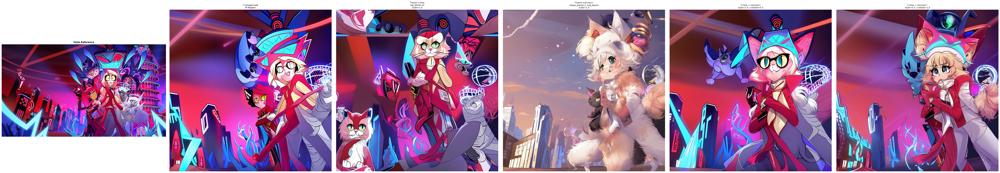

In [55]:
import torch
from PIL import Image
from diffusers import StableDiffusionXLPipeline
from diffusers.models.attention_processor import IPAdapterAttnProcessor2_0
from transformers import CLIPVisionModelWithProjection
import matplotlib.pyplot as plt


# ── константы ─────────────────────────────────────────────────────────────────
STYLE_BLOCKS   = ["up_blocks.0"]
CONTEXT_BLOCKS = ["down_blocks.2", "mid_block"]

BIG_SCALE   = 1.0
SMALL_SCALE = 0.5

PROMPT          = "fluffy cat"
NEGATIVE_PROMPT = "blurry, low quality, ugly"
SEED            = 42


# ── загрузка ──────────────────────────────────────────────────────────────────
print("Загрузка pipeline...")
pipe = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    use_safetensors=True,
).to("cuda")

print("Загрузка image encoder...")
pipe.image_encoder = CLIPVisionModelWithProjection.from_pretrained(
    "laion/CLIP-ViT-H-14-laion2B-s32B-b79K",
    torch_dtype=torch.float16,
).to("cuda")

print("Загрузка IP-Adapter...")
pipe.load_ip_adapter(
    "h94/IP-Adapter",
    subfolder="sdxl_models",
    weight_name="ip-adapter-plus_sdxl_vit-h.bin",
    image_encoder_folder=None,
)
pipe.set_ip_adapter_scale(1.0)


# ── проверка блоков ───────────────────────────────────────────────────────────
def get_all_ip_block_names(pipe):
    return sorted([
        name for name, module in pipe.unet.named_modules()
        if isinstance(getattr(module, "processor", None), IPAdapterAttnProcessor2_0)
    ])


def check_blocks(pipe, style_blocks, context_blocks):
    all_blocks = get_all_ip_block_names(pipe)

    print(f"\nВсего IP-Adapter блоков: {len(all_blocks)}")

    # проверяем что заданные блоки реально существуют
    for label, blocks in [("STYLE", style_blocks), ("CONTEXT", context_blocks)]:
        matched = [b for b in all_blocks if any(sb in b for sb in blocks)]
        print(f"\n{label}_BLOCKS → совпадений: {len(matched)}")
        for name in matched:
            print(f"  ✓ {name}")

    # блоки которые не попадают ни в стиль ни в контекст
    uncovered = [
        b for b in all_blocks
        if not any(sb in b for sb in style_blocks + context_blocks)
    ]
    print(f"\nНепокрытые блоки: {len(uncovered)}")
    for name in uncovered[:5]:
        print(f"  - {name}")
    if len(uncovered) > 5:
        print(f"  ... и ещё {len(uncovered) - 5}")


check_blocks(pipe, STYLE_BLOCKS, CONTEXT_BLOCKS)


# ── управление scale ──────────────────────────────────────────────────────────
def set_block_scales(pipe, config: dict):
    """
    config: { "подстрока_блока": scale, ... }
    блоки не попавшие ни в одну подстроку → scale=0.0
    """
    for name, module in pipe.unet.named_modules():
        proc = getattr(module, "processor", None)
        if isinstance(proc, IPAdapterAttnProcessor2_0):
            scale = 0.0
            for block_pattern, block_scale in config.items():
                if block_pattern in name:
                    scale = block_scale
                    break
            proc.scale = [scale]


# ── генерация ─────────────────────────────────────────────────────────────────
def generate(scale_config=None, seed=SEED):
    """
    scale_config=None → стандартный ip-adapter (все блоки, scale=1.0)
    scale_config={}   → кастомные scale по блокам
    """
    if scale_config is None:
        pipe.set_ip_adapter_scale(1.0)
    else:
        set_block_scales(pipe, scale_config)

    return pipe(
        prompt=PROMPT,
        negative_prompt=NEGATIVE_PROMPT,
        ip_adapter_image=style_reference,
        guidance_scale=5.0,
        num_inference_steps=30,
        generator=torch.Generator("cuda").manual_seed(seed),
    ).images[0]


# ── эксперименты ──────────────────────────────────────────────────────────────
style_reference = Image.open("assets/hazbin.jpg")

experiments = [
    (
        "Стандартный\nIP-Adapter",
        None,
    ),
    (
        f"Только стиль\n({', '.join(STYLE_BLOCKS)})\nscale={BIG_SCALE}",
        {b: BIG_SCALE for b in STYLE_BLOCKS},
    ),
    (
        f"Только контекст\n({', '.join(CONTEXT_BLOCKS)})\nscale={BIG_SCALE}",
        {b: BIG_SCALE for b in CONTEXT_BLOCKS},
    ),
    (
        f"Стиль + контекст\nstyle={BIG_SCALE} / context={SMALL_SCALE}",
        {**{b: BIG_SCALE for b in STYLE_BLOCKS},
         **{b: SMALL_SCALE for b in CONTEXT_BLOCKS}},
    ),
    (
        f"Стиль + контекст\nstyle={SMALL_SCALE} / context={BIG_SCALE}",
        {**{b: SMALL_SCALE for b in STYLE_BLOCKS},
         **{b: BIG_SCALE for b in CONTEXT_BLOCKS}},
    ),
]

print("\nГенерация:")
results = []
for title, config in experiments:
    print(f"  → {title.replace(chr(10), ' ')}")
    results.append((title, generate(scale_config=config)))


# ── визуализация ──────────────────────────────────────────────────────────────
n = len(results) + 1
fig, axes = plt.subplots(1, n, figsize=(10 * n, 10))

axes[0].imshow(style_reference)
axes[0].set_title("Style Reference", fontsize=10, fontweight="bold")
axes[0].axis("off")

for ax, (title, img) in zip(axes[1:], results):
    ax.imshow(img)
    ax.set_title(title, fontsize=9)
    ax.axis("off")

plt.tight_layout()
plt.show()

## 6. Смешанные методы

### 6.1 InstantID (2024)

![inst-id](assets/inst-id.png)

> Wang et al., "InstantID: Zero-shot Identity-Preserving Generation in Seconds", arXiv:2401.07519

InstantID решает задачу **personalised avatar generation** по одной фотографии без файнтюнинга .

**Архитектура: два канала передачи identity:**

```
Входное изображение лица
          │
    InsightFace
    ┌──────┴──────┐
    │             │
Face embedding  5 keypoints
(512-dim)       (landmark)
    │             │
    ↓             ↓
┌─────────┐   ┌───────────┐
│IP-Adapter│   │IdentityNet│
│(семантика│   │(кастомный │
│identity) │   │ControlNet)│
└─────────┘   └───────────┘
    │               │
    ↓               ↓
Cross-attention  Spatial
  injection     conditioning
    │               │
    └───────┬───────┘
            ↓
      SDXL UNet
```

**Канал 1: IP-Adapter (семантический)**

```
Face embedding → Image Projection → KV cross-attention
→ передаёт: кто это (identity semantics)
```

**Канал 2: IdentityNet (пространственный)**

```
5 facial keypoints → ControlNet-условие
Face embedding используется ВМЕСТО текстовых эмбеддингов
→ передаёт: где расположены черты лица
```

**Почему 5 keypoints, а не полное изображение лица:**

```
полное изображение → жёсткий spatial constraint
  → точная копия позы и экспрессии

5 keypoints → мягкий spatial constraint
  → только расположение глаз, носа, рта
  → гибкость для разных поз и стилей
  → работает когда лицо занимает малую часть кадра
```

**Что обучается:**

```
Image Adapter (IP-Adapter часть):  обучается
IdentityNet (кастомный ControlNet): обучается
SDXL:                               заморожена
```

---

### 6.2 Зачем комбинировать IP-Adapter + ControlNet

```
Задача: "сгенерировать себя в образе киберпанк-детектива"

IP-Adapter-FaceID: "это моё лицо"         → кто
ControlNet-Pose:   "такая поза"           → где
Text prompt:       "cyberpunk detective"  → в каком мире

три условия работают независимо:
→ identity: кто изображён
→ structure: как стоит/сидит
→ semantics: в каком стиле
```

---

### 6.3 Другие примеры

**PhotoMaker (2024):**

```
→ несколько фотографий одного человека
  → усреднённый identity embedding
→ встраивает identity через textual inversion + LoRA
→ требует файнтюнинга в отличие от InstantID
```

**StyleAligned (2024):**

```
→ shared attention между несколькими
  изображениями пайплайна
→ style consistency без явного style encoder
→ inference-time trick (как InstantStyle)
```
